# Random Forest Model + Explainable AI Techniques (XAI)

## Data Preparation

In [1]:
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

Load Train Dataset

In [2]:
df_train = pd.read_csv("../0_Datasets/Farm-Flow/train.csv")

In [3]:
display(df_train)

,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,...,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,traffic,is_attack
0,-0.236304,-0.662387,-0.577140,-0.443123,-0.277741,-0.268577,-0.273647,-1.394192,-0.643844,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
1,-0.672105,-0.457813,-0.577140,-0.443123,0.490111,0.504662,0.498222,0.728588,-0.643844,0.278456,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.419418,-0.741186,-0.418623,Port_Scanning,1
2,-0.454205,-0.662387,-0.577140,-0.443123,-0.277918,-0.268577,-0.273736,-1.394192,-0.724235,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
3,2.378496,2.406229,2.285759,2.444445,-0.276874,-0.267504,-0.272675,0.728588,2.129645,-0.147053,...,-0.240860,1.678331,-0.105550,-0.268638,2.620142,2.654541,1.265201,2.728235,Normal,0
4,-0.672105,-0.457813,-0.577140,-0.443123,-0.277823,-0.268460,-0.273629,0.728588,-0.684039,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.670339,-0.529202,-0.741186,-0.418623,MQTT_Flood,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47341,-0.454205,-0.457813,-0.577140,-0.443123,-0.276776,-0.267991,-0.272869,-0.332802,-0.483062,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.329944,-0.419418,-0.741186,-0.418623,TCP_Flood,1
47342,-0.454205,-0.662387,-0.577140,-0.443123,-0.277509,-0.268577,-0.273530,-1.394192,-0.724235,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
47343,2.160596,1.997080,2.285759,2.444445,-0.276943,-0.267646,-0.272781,0.576960,1.928668,-0.147053,...,-0.240860,1.678331,-0.054762,-0.267306,0.275202,0.312477,-0.072391,0.630330,Normal,0
47344,1.288996,1.383357,1.713179,0.711904,-0.265775,-0.256330,-0.261520,0.728588,2.330623,1.129475,...,-0.250326,0.400251,-0.238680,-0.346375,1.485493,1.556699,0.470671,0.378581,Normal,0


Load Test Dataset

In [4]:
df_test = pd.read_csv("../0_Datasets/Farm-Flow/test.csv")

In [5]:
display(df_test)

,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,...,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,traffic,is_attack
0,-0.672105,-0.457813,-0.577140,-0.443123,-0.276940,-0.267571,-0.272742,0.728588,-0.684039,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.419418,-0.741186,-0.418623,MQTT_Flood,1
1,-0.672105,-0.457813,-0.577140,-0.443123,-0.277181,-0.267813,-0.272983,0.728588,-0.684039,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.419418,-0.741186,-0.418623,MQTT_Flood,1
2,-0.454205,-0.457813,-0.577140,-0.443123,-0.276909,-0.268058,-0.272969,-0.332802,-0.483062,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.329944,-0.419418,-0.741186,-0.418623,TCP_Flood,1
3,2.378496,2.406229,2.285759,2.444445,-0.276907,-0.267537,-0.272708,0.728588,2.129645,-0.147053,...,-0.240860,1.678331,-0.105550,-0.268638,2.620142,2.654541,1.265201,2.728235,Normal,0
4,-0.454205,-0.253238,-0.004560,-0.443123,-0.276892,-0.267522,-0.272693,0.728588,-0.241889,1.129475,...,-0.477522,-0.635539,-0.408378,-0.455263,-0.329944,-0.199849,-0.596727,-0.418623,HTTP_Flood,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15778,1.942696,2.201655,2.285759,2.444445,-0.277003,-0.267561,-0.272768,0.891878,1.727690,-0.147053,...,-0.240860,1.678331,-0.054762,-0.267306,0.691239,0.897993,0.262007,1.154806,Arp_Spoofing,1
15779,2.160596,2.201655,2.285759,2.444445,-0.276991,-0.267622,-0.272793,0.728588,1.928668,-0.147053,...,-0.240860,1.678331,-0.072901,-0.267431,2.393212,2.434972,1.265201,2.728235,Normal,0
15780,-0.236304,-0.662387,-0.577140,-0.443123,-0.277906,-0.268577,-0.273730,-1.394192,-0.643844,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
15781,-0.454205,-0.662387,-0.577140,-0.443123,-0.277687,-0.268577,-0.273620,-1.394192,-0.724235,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1


-----
## Train and Test Datasets

Drop Multiclass Column

In [6]:
df_train = df_train.drop('traffic', axis=1)
df_test = df_test.drop('traffic', axis=1)

Excluding the target variable

In [7]:
X_columns = df_train.columns.drop('is_attack')

Create a feature matrix X by selecting only the columns specified in X_columns. Then convert the selected data into a NumPy array.

In [8]:
X = df_train[X_columns].values

Creates a target variable y containing the target variable

In [9]:
y = df_train["is_attack"].values

Split into training and testing sets

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

Load Previous Trained Model

In [11]:
# Load the saved Random Forest model
model_folder = "../2_Modeling_Phase/Saved-Models/"
model_filename = "Farm-Flow_RF_Random_Forest_Model.joblib"
model_path = model_folder + model_filename

model = joblib.load(model_path)

Get Features Names and Class Names

In [12]:
feature_names = list(X_columns)
class_names = ["Normal", "Malicious"]
response_dict = {0: 'Normal', 1: 'Malicious'}

Generate Prediction

In [13]:
pred = model.predict(X_test)

Labeled Df's

In [14]:
X_test_labeled = pd.DataFrame(X_test, columns=feature_names)
X_train_labeled = pd.DataFrame(X_train, columns=feature_names)

# Since both are one-dimensional NumPy arrays
pred_series = pd.Series(pred)
y_test_target_series = pd.Series(y_test)
y_train_target_series = pd.Series(y_train)

Create a subset of the Train DF for faster training

In [15]:
subset_percentage = 0.1
X_subset, _, y_subset, _ = train_test_split(X_train, y_train, test_size=1 - subset_percentage, stratify=y_train)

In [16]:
subset_percentage = 0.1
X_subset_labeled, _, y_subset_labeled, _ = train_test_split(X_train_labeled, y_train_target_series, test_size=1 - subset_percentage, stratify=y_train_target_series)

-------

# Explainable AI Techniques (XAI)

Row I want to explain

In [17]:
idx = 0

In [18]:
feature_names

['fwd_pkts_tot',
 'bwd_pkts_tot',
 'fwd_data_pkts_tot',
 'bwd_data_pkts_tot',
 'fwd_pkts_per_sec',
 'bwd_pkts_per_sec',
 'flow_pkts_per_sec',
 'down_up_ratio',
 'fwd_header_size_tot',
 'fwd_header_size_min',
 'fwd_header_size_max',
 'bwd_header_size_tot',
 'bwd_header_size_min',
 'bwd_header_size_max',
 'fwd_pkts_payload.min',
 'fwd_pkts_payload.max',
 'fwd_pkts_payload.tot',
 'fwd_pkts_payload.avg',
 'fwd_pkts_payload.std',
 'bwd_pkts_payload.min',
 'bwd_pkts_payload.max',
 'bwd_pkts_payload.tot',
 'bwd_pkts_payload.avg',
 'bwd_pkts_payload.std',
 'flow_pkts_payload.min',
 'flow_pkts_payload.max',
 'flow_pkts_payload.tot',
 'flow_pkts_payload.avg',
 'flow_pkts_payload.std',
 'fwd_subflow_pkts',
 'bwd_subflow_pkts',
 'fwd_subflow_bytes',
 'bwd_subflow_bytes']

## LIME

### How it works
Generate locally interpretable explanations for the predictions of machine learning models by approximating their behaviour with simpler, interpretable models at the instance level.

Works by generating perturbed instances around a particular data point of interest and observing the corresponding predictions of the black box model. It then fits a simpler, interpretable model (such as a linear regression or decision tree) to explain the predictions of the black-box model based on the perturbed data.

### How does it apply
Can help security analysts understand why a particular instance is or is not classified as malicious. This interpretability helps build confidence in the model, identify potential weaknesses or biases, and improve the overall understanding of the decision-making process. As well as identifying which features have the most impact and how confident the model was in that prediction.

### Repository:
- https://github.com/marcotcr/lime

### Paper:
- https://arxiv.org/abs/1602.04938

In [19]:
import lime
from lime.lime_tabular import LimeTabularExplainer

Create a LIME instance for Tabular Explainer for explaining predictions of the machine learning model

In [20]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, discretize_continuous=True)

Generate an explanation for a particular instance in the test set and we can see which decisions the model made based on the features and how much impact they had. Helps us understand how each feature was achieved

In [21]:
exp = explainer.explain_instance(X_test[idx], model.predict_proba, num_features=10, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=False)

## SHAP

### How it works
Based on cooperative game theory and the concept of Shapley values. The Shapley value, originally introduced in economics, assigns each player in a cooperative game a value based on their marginal contributions to all possible coalitions.

Shapley values provide a way to fairly distribute the 'credit' for a model's prediction among its features. They quantify the impact of each feature on the model's output for a given instance, taking into account all possible combinations of features. This results in a more complete and balanced understanding of the importance of features.

### How does it apply
Once SHAP values have been calculated, they can be used to interpret the output of the model for that particular case. Positive SHAP values indicate a positive influence on the model output, while negative values indicate a negative influence. Features with larger absolute SHAP values have a greater influence on the prediction.

SHAP values can be visualised using different plots such as SHAP summary plots. These visualisations provide a clear overview of the importance of features for a particular prediction and help to understand the role of each feature in the model's decision.

### Repository:
- https://github.com/shap/shap

### Paper:
- https://papers.nips.cc/paper_files/paper/2017/hash/8a20a8621978632d76c43dfd28b67767-Abstract.html

In [22]:
import shap

shap.initjs()

Generate the Explainer

In [23]:
#explainer = shap.Explainer(model)
explainer = shap.TreeExplainer(model)

shap_values will contain the computed SHAP values for the features of the selected instance. Positive values indicate a positive impact on the prediction, while negative values indicate a negative impact.

In [24]:
start_index = 0
end_index = 1

shap_values = explainer.shap_values(X_test[start_index:end_index])

In [25]:
prediction = model.predict(X_test[start_index:end_index])[0]
print(f'The predicted class is: {class_names[int(prediction)]}')

The predicted class is: Malicious


Contributions of each feature to the model's prediction for a specific instance.

In [26]:
shap.initjs()

shap.force_plot(explainer.expected_value[1],
                shap_values[1],
                X_test[start_index:end_index],
                feature_names=feature_names)

#### shap.Explainer(model)

- This is a generic explainer that can be used with any type of machine learning model.
- It is model-agnostic and can handle a wide range of model types, including linear models, neural networks, and more.
- It approximates the Shapley values using a sampling approach, which might be computationally expensive for complex models or large datasets.

#### shap.TreeExplainer(model)

- This explainer is specifically designed for tree-based models, such as decision trees, random forests, and gradient boosting machines.
- It leverages the exact Shapley value computation for tree ensembles, making it computationally efficient for tree-based models.
- It provides accurate and faster Shapley values for tree models.

The plot visualizes the impact of each feature on the model's output for the specified instance.

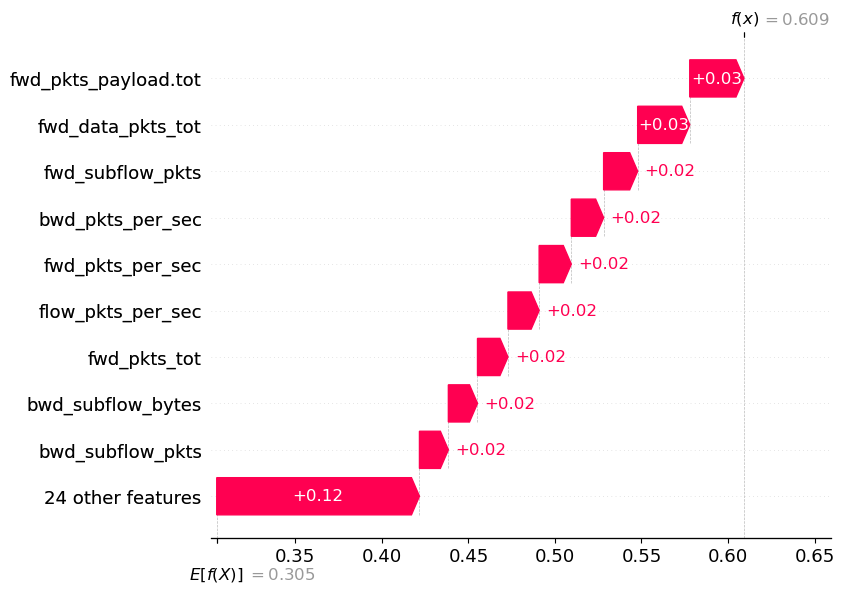

In [27]:
base_value = explainer.expected_value

explanation = shap.Explanation(values=shap_values[1], base_values=base_value,feature_names=feature_names)

shap.plots.waterfall(explanation[0])

Gain insights into which features have the most significant impact on model predictions across the dataset.

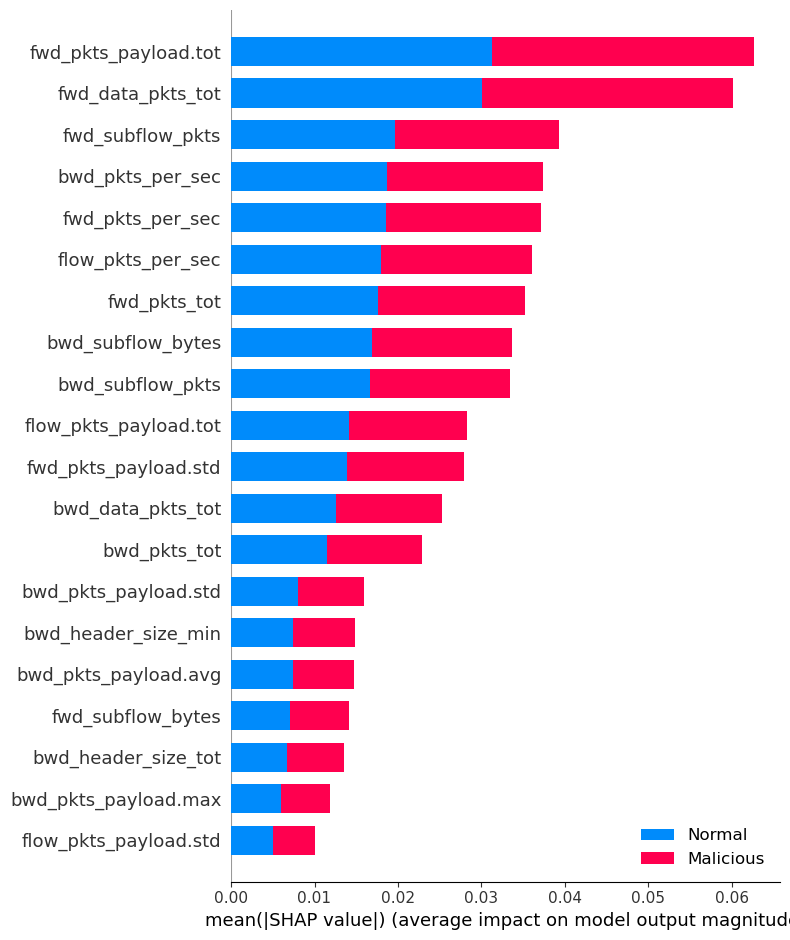

In [28]:
shap.summary_plot(shap_values, X_test,feature_names=feature_names,class_names=class_names)

## Shapash

### How it works
Shapash is a Python library designed to make machine learning interpretable and understandable for everyone. It provides different visualisations with clear and explicit labels that can be easily understood by anyone.

With Shapash, you can build a web application that makes it easy to understand the interactions between the features of the model and allows seamless navigation between local and global explainability.

### How does it apply
It works in a similar way to SHAP, but offers an alternative set of perspectives on the data, along with additional visualisation graphics.

### Repository:
- https://github.com/MAIF/shapash

Understanding model with shapash

In [29]:
#!pip install shapash

In [30]:
from shapash import SmartExplainer

In [31]:
xpl = SmartExplainer(model=model, label_dict=response_dict)

xpl.compile(x=X_test_labeled,
            y_pred=pred_series,
            y_target=y_test_target_series)

INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x000001D458BCC050>


Display features importance

In [32]:
xpl.plot.features_importance()

Focus on a specific subset, and compare it with the global view

In [33]:
subset = [ 168, 54, 995, 799, 310, 322, 1374,
          1106, 232, 645, 1170, 1229, 703, 66,
          886, 160, 191, 1183, 1037, 991, 482,
          725, 410, 59, 28, 719, 337, 36]

xpl.plot.features_importance(selection=subset)

Display a Summarized but Explicit local explainability

Filter method
- max_contrib : maximum number of criteria to display 
- threshold : minimum value of the contribution (in absolute value) necessary to display a criterion 
- positive : display only positive contribution? Negative?(default None) 
- features_to_hide : list of features you don’t want to display

In [34]:
xpl.filter(max_contrib=8,threshold=100)

In [35]:
xpl.plot.local_plot(index=560)

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



Contributions comparing plot

https://shapash.readthedocs.io/en/latest/tutorials/plots_and_charts/tuto-plot04-compare_plot.html

In [36]:
from shapash.explainer.smart_explainer import SmartExplainer

In [37]:
y_pred = pd.DataFrame(model.predict(X_test_labeled),columns=['pred'],index=X_test_labeled.index)

xpl.compile(x=X_test_labeled,y_pred=y_pred)

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x000001D459233490>


Compare how to index, compare to each others in terms of what feature had a bigger influence in the choice.

In [38]:
rows_to_explain = [8,17]

xpl.plot.compare_plot(row_num=rows_to_explain, show_predict=False, max_features=100)

scatter_plot_prediction

https://shapash.readthedocs.io/en/latest/tutorials/plots_and_charts/tuto-plot06-prediction_plot.html

In [39]:
from shapash import SmartExplainer

In [40]:
xpl_classifier = SmartExplainer(model=model,label_dict=response_dict)

In [41]:
xpl_classifier.compile(x=X_test_labeled,y_target=y_test_target_series)

INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x000001D45DCFC190>


Plot to visualize the ammount of FP and FN in the model predictions

In [42]:
xpl_classifier.plot.scatter_plot_prediction()

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names



## Interpret ML

### How it works
- Model debugging: Uncover the causes of your model's errors to improve performance.
- Feature engineering: Extend the capabilities of your model by optimising feature selection and representation.
- Detect fairness issues: Evaluate whether your model exhibits discriminatory behaviour and address fairness concerns.
- Human-AI collaboration: Foster understanding and trust in the decision-making process by facilitating human-AI collaboration.
- Regulatory compliance: Ensure that your model meets legal requirements and complies with regulatory standards.

### How does it apply
Enables the visualisation of various XAI techniques, including LIME and SHAP, in a more intuitive and user-friendly way. To use it effectively, we strategically select a subset of training data, as larger datasets can lead to longer training times. By comparing these results with the test dataset, we gain insight into how the model makes decisions. A notable feature is the ability to examine the 'base value' or 'intercept', providing transparency into the model's biases.

### Repository:
- https://github.com/interpretml/interpret/
- https://interpret.ml/docs/blackbox.html

### Paper:
- https://arxiv.org/pdf/1909.09223.pdf

With Shapley Additive Explanations (SHAP)

In [43]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

from interpret import show
from interpret.blackbox import ShapKernel

from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [44]:
pca = PCA()

blackbox_model = Pipeline([('pca', pca), ('rf', model)])
blackbox_model.fit(X_train, y_train)

shap = ShapKernel(blackbox_model, X_subset_labeled,feature_names=feature_names)
#shap = ShapKernel(blackbox_model, X_train[:200],feature_names=feature_names)
shap_local = shap.explain_local(X_subset[:20], y_subset[:20])

show(shap_local, 0)

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:interpret.utils._unify_data:Unifying data
C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:interpret.utils._unify_data:Unifying data


  0%|          | 0/20 [00:00<?, ?it/s]

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:shap:num_full_subsets = 1
INFO:shap:remaining_weight_vector = array([0.17443519, 0.12030013, 0.09344742, 0.07752675, 0.06709046,
       0.05980635, 0.054511  , 0.05056092, 0.04757323, 0.04530784,
       0.0436088 , 0.04237292, 0.04153219, 0.04104357, 0.04088325])
INFO:shap:num_paired_subset_sizes = 15
INFO:shap:weight_left = 0.74368134682094
C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:shap:np.sum(w_aug) = 32.0
INFO:shap:np.sum(self.kernelWeights) = 1.0
INFO:shap:phi = array([0.01729135, 0.00010994, 0.01407342, 0.02233702, 0.00369705,
       0.01045366, 0.00502307, 0.00673664, 0.02695599, 0.00810485,
       0.00394577, 0.00671405, 0.00771058, 0.        , 0.        ,
       0.0048877 , 0.        , 0.00541094, 0.        , 0.015

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:shap:num_full_subsets = 1
INFO:shap:remaining_weight_vector = array([0.17443519, 0.12030013, 0.09344742, 0.07752675, 0.06709046,
       0.05980635, 0.054511  , 0.05056092, 0.04757323, 0.04530784,
       0.0436088 , 0.04237292, 0.04153219, 0.04104357, 0.04088325])
INFO:shap:num_paired_subset_sizes = 15
INFO:shap:weight_left = 0.74368134682094
C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:shap:np.sum(w_aug) = 32.0
INFO:shap:np.sum(self.kernelWeights) = 1.0
INFO:shap:phi = array([ 0.01557941,  0.00866769,  0.0099184 ,  0.00883587,  0.01428397,
        0.00468712, -0.01276382,  0.011787  ,  0.02070477,  0.01666378,
        0.01204102,  0.016263  ,  0.01498099,  0.00443778,  0.        ,
        0.00857779,  0.02197114,  0.02246694,

C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:shap:num_full_subsets = 1
INFO:shap:remaining_weight_vector = array([0.17443519, 0.12030013, 0.09344742, 0.07752675, 0.06709046,
       0.05980635, 0.054511  , 0.05056092, 0.04757323, 0.04530784,
       0.0436088 , 0.04237292, 0.04153219, 0.04104357, 0.04088325])
INFO:shap:num_paired_subset_sizes = 15
INFO:shap:weight_left = 0.74368134682094
C:\Users\ivoafonsobispo\anaconda3\Lib\site-packages\sklearn\base.py:457: UserWarning:

X has feature names, but PCA was fitted without feature names

INFO:shap:np.sum(w_aug) = 32.0
INFO:shap:np.sum(self.kernelWeights) = 1.0
INFO:shap:phi = array([ 0.02502562,  0.00269379,  0.0164519 ,  0.0102066 ,  0.00545278,
        0.00922567, -0.00256284,  0.00635808,  0.02366262,  0.01748701,
        0.01699936,  0.02805826,  0.02047219,  0.        , -0.00608513,
        0.01823586,  0.02116687,  0.0149241 ,

With Local Interpretable Model-agnostic Explanations (LIME) 

**Curiosity** and needs more understanding, is how for the same row in the test dataset, SHAP values shows other features that had a greater impact in how the model choose, and in the LIME we have another set of features with different impact has the shap?

SHAP values:

- Concept: SHAP values are rooted in cooperative game theory and aim to fairly distribute the "impact" of each feature across all possible combinations of features.
- Calculation: SHAP values calculate the average contribution of each feature to the model prediction across all possible permutations of feature values.
- Consistency: SHAP scores are consistent and ensure that the sum of the scores for all features equals the difference between the model prediction and the average prediction.

LIME:

- Concept: LIME takes a different approach by generating local interpretable models around a specific instance to approximate the behaviour of the complex model in that local region.
- Computation: LIME perturbs the input data, generates a local model for each perturbed instance, and weights the influence of features based on their impact on the prediction of the local model.
- Consistency: LIME may not guarantee consistency because the explanation relies heavily on the local surrogate model.

Because SHAP and LIME use different strategies, it's expected that variations in features and their effects will be observed on the same row in the test dataset. SHAP provides a global perspective on feature importance across the dataset, considering all possible combinations of features. On the other hand, LIME provides a local, instance-specific explanation, which may result in highlighting different features and impacts for the same row.

In [45]:
from interpret.blackbox import LimeTabular

In [ ]:
lime = LimeTabular(model=model, data=X_train, feature_names=feature_names, class_names=class_names)
lime_local = lime.explain_local(X_subset, y_subset, name='LIME')

show(lime_local)

INFO:interpret.utils._unify_data:Unifying data
INFO:interpret.utils._unify_data:Unifying data


With Morris Sensitivity Analysis, is another way to see and understand the model feature importance

In [ ]:
from interpret.blackbox import MorrisSensitivity

- Mu (μ): used to represent the average or mean of a dataset.

- Mu_star (μ): Mu_star represent an adjusted or transformed mean. The difference between Mu and Mu_star indicates transformation or modification applied to the data.

- Sigma (σ): Sigma  represents the standard deviation.

- Mu_star Confidence: Level of confidence associated with the Mu_star value.

In [ ]:
msa = MorrisSensitivity(blackbox_model, X_train,feature_names=feature_names)

show(msa.explain_global())

## Dalex

### How it works
The DALEX package xrays any model and helps to explore and explain its behaviour, helps to understand how complex models are working. The main function explain() creates a wrapper around a predictive model. Wrapped models may then be explored and compared with a collection of local and global explainers.

### How does it apply
Helps us understand and compare other machine learning models, as well as, works as another fork of SHAP and LIME.

### Repository:
- https://github.com/ModelOriented/DALEX
- https://dalex.drwhy.ai/python-dalex-xgboost.html

### Paper:
- https://arxiv.org/abs/2012.14406

In [ ]:
#!pip install dalex -U

In [ ]:
import dalex as dx

Compare Models

In [ ]:
model_filename = "Farm-Flow_MLPClassifier.joblib"
model_path = model_folder + model_filename

model_mlp = joblib.load(model_path)

In [ ]:
exp = dx.Explainer(model, X_train_labeled, y_train_target_series)
exp_mlp = dx.Explainer(model_mlp, X_train_labeled, y_train_target_series)

In [ ]:
mp = exp.model_performance("classification")
mp_mlp = exp_mlp.model_performance("classification")

In [ ]:
mp.result

In [ ]:
mp_mlp

In [ ]:
mp.plot(mp_mlp)

## Anchor

### How it works
An anchor explanation is a rule that sufficiently “anchors” the prediction locally – such that changes to the rest of the feature values of the instance do not matter. In other words, for instances on which the anchor holds, the prediction is (almost) always the same.

### How does it apply
We can see almost like a PDF file the summary of every choice the model made to predict that value

### Repository:
- https://github.com/marcotcr/anchor

### Paper:
- https://homes.cs.washington.edu/~marcotcr/aaai18.pdf

In [ ]:
#!pip install anchor-exp

In [ ]:
from anchor import utils
from anchor import anchor_tabular

In [ ]:
explainer = anchor_tabular.AnchorTabularExplainer(
    class_names,
    feature_names,
    X_train)

In [ ]:
np.random.seed(1)
print('Prediction: ', explainer.class_names[model.predict(X_test[idx].reshape(1, -1))[0]])
exp = explainer.explain_instance(X_test[idx], model.predict, threshold=0.95)

In [ ]:
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.2f' % exp.precision())
print('Coverage: %.2f' % exp.coverage())

In [ ]:
# Get test examples where the anchora pplies
fit_anchor = np.where(np.all(X_test[:, exp.features()] == X_test[idx][exp.features()], axis=1))[0]
print('Anchor test precision: %.2f' % (np.mean(model.predict(X_test[fit_anchor]) == model.predict(X_test[idx].reshape(1, -1)))))
print('Anchor test coverage: %.2f' % (fit_anchor.shape[0] / float(X_test.shape[0])))

In [ ]:
print('Partial anchor: %s' % (' AND '.join(exp.names(1))))
print('Partial precision: %.2f' % exp.precision(1))
print('Partial coverage: %.2f' % exp.coverage(1))

In [ ]:
fit_partial = np.where(np.all(X_test[:, exp.features(1)] == X_test[idx][exp.features(1)], axis=1))[0]
print('Partial anchor test precision: %.2f' % (np.mean(model.predict(X_test[fit_partial]) == model.predict(X_test[idx].reshape(1, -1)))))
print('Partial anchor test coverage: %.2f' % (fit_partial.shape[0] / float(X_test.shape[0])))

In [ ]:
exp.show_in_notebook()

## IModels

### How it works
Modern machine-learning models are increasingly complex, often making them difficult to interpret. This package provides a simple interface for fitting and using state-of-the-art interpretable models, all compatible with scikit-learn. These models can often replace black-box models (e.g. random forests) with simpler models (e.g. rule lists) while improving interpretability and computational efficiency, all without sacrificing predictive accuracy! Simply import a classifier or regressor and use the fit and predict methods, same as standard scikit-learn models.

### How it applys
Library to compare models

### Repository:
- https://github.com/csinva/imodels

### Paper:
- https://joss.theoj.org/papers/10.21105/joss.03192

In [ ]:
#!pip install imodels

In [ ]:
from imodels import HSTreeClassifierCV

In [ ]:
immodel = HSTreeClassifierCV(max_leaf_nodes=4)  # initialize a tree model and specify only 4 leaf nodes
immodel.fit(X_train, y_train, feature_names=feature_names)   # fit model
preds = immodel.predict(X_test) # discrete predictions: shape is (n_test, 1)
preds_proba = model.predict_proba(X_test) # predicted probabilities: shape is (n_test, n_classes)

In [ ]:
immodel

In [ ]:
from sklearn.tree import plot_tree

tree_to_plot = model.estimators_[0]

# Convert the Pandas Index to a list
#feature_names_list = feature_names.tolist()

plt.figure(dpi=300)
plot_tree(tree_to_plot, feature_names=feature_names, filled=True, rounded=True, class_names=class_names)
plt.show()

Figs Classifier

In [ ]:
from imodels import FIGSClassifier

In [ ]:
model_figs = FIGSClassifier(max_rules=7, max_trees=3)

In [ ]:
model_figs.fit(X_train, y_train, feature_names=feature_names)

In [ ]:
model_figs.print_tree(X_train, y_train)

Gini Importance

In [ ]:
dfp_importance = pd.DataFrame({'feat_names': feature_names})
dfp_importance['feature'] = dfp_importance.index
dfp_importance_gini = pd.DataFrame({'importance_gini': model_figs.feature_importances_})
dfp_importance_gini['feature'] = dfp_importance_gini.index
dfp_importance_gini['importance_gini_pct'] = dfp_importance_gini['importance_gini'].rank(pct=True)
dfp_importance = pd.merge(dfp_importance, dfp_importance_gini, on='feature', how='left')
dfp_importance = dfp_importance.sort_values(by=['importance_gini', 'feature'], ascending=[False, True]).reset_index(drop=True)
display(dfp_importance)